In [ ]:
PROMT_MDETR = 'the largest object'  # replace this prompt with a prompt of the object you want to detect
# or you can do it directly in a function that uses PROMT_MDETR

#### Load Dep

In [ ]:
! pip install transformers

In [ ]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 23.2 MB/s eta 0:00:00


#### Load MDETR For Detection

In [ ]:
from IPython.display import Image
from IPython.core.display import HTML
Image(url="https://production-media.paperswithcode.com/methods/Screen_Shot_2021-08-11_at_10.03.50_AM.png")

In [ ]:
!pip install torchmultimodal-nightly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.3/256.3 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.7/73.7 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.5/12.5 MB 79.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 76.7 MB/s eta 0:00:00
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31532 sha256=0f7fb73cf956f292d037abc549d18c8724098f4ff04d71d7761a4ceb3576e088
  Stored in directory: /root/.cache/pip/wheels/9a/a3/b6/ac0fcd1b4ed5cfeb3db92e6a0e476cfd48ed0df92b91080c1d
Successfully built iopath


In [ ]:
# Simplest entry point: model builder function.
# Provides prebuilt model from the paper with ResNet101 backbone.
from torchmultimodal.models.mdetr.model import mdetr_resnet101
mdetr_rn101 = mdetr_resnet101()

# The builder function contains sensible default values but can also be easily modified.
# E.g. we can modify the number of object queries and change the transformer FFN dimension
modified_mdetr_rn101 = mdetr_resnet101(num_queries=100, transformer_dim_feedforward=1024)

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:00<00:00, 180MB/s]


In [ ]:
# mdetr_resnet101 is an instantiation of the MDETR model class.
# This class is composed of modular components which can be swapped out for easy experimentation.
from torchmultimodal.models.mdetr.model import MDETR

# Other imports we will use
import math
from torch import nn
from torchmultimodal.modules.layers.mlp import MLP
from torchmultimodal.models.mdetr.model import FeatureResizer
from torchmultimodal.models.mdetr.image_encoder import mdetr_resnet101_backbone, MaskedIntermediateLayer, PositionEmbedding2D
from torchmultimodal.models.mdetr.text_encoder import mdetr_roberta_text_encoder
from torchmultimodal.models.mdetr.transformer import mdetr_transformer

# Set some dimensions as constant
image_embedding_dim = 2048
text_embedding_dim = 768
transformer_dim = 256
num_queries = 100
num_classes = 255

# The core components of the MDETR model class are:
#   - image backbone
#   - text encoder
#   - multimodal transformer

# Encoder and transformer components also have builder functions.
image_backbone = mdetr_resnet101_backbone()
text_encoder = mdetr_roberta_text_encoder()
transformer = mdetr_transformer()

# Other components include
#   - positional embeddings: 2D embeddings added to image backbone outputs
#   - text/image projections (between unimodal encoders and multimodal transformer)
#   - query embeddings: learned object query embeddings, used in multimodal transformer decoder
#   - bounding box embeddings: map multimodal transformer outputs to bounding box coordinates
#   - class embeddings: map multimodal transformer outputs to class logits

pos_embed = PositionEmbedding2D(num_pos_feats=128, scale=2 * math.pi)
text_projection = FeatureResizer(text_embedding_dim, transformer_dim)
image_projection = nn.Conv2d(image_embedding_dim, transformer_dim, kernel_size=1)
query_embed = nn.Embedding(num_queries, transformer_dim)
bbox_embed = MLP(transformer_dim, 4, [transformer_dim] * 2, dropout=0.0)
class_embed = nn.Linear(transformer_dim, num_classes + 1)

# This will give us the original ResNet101 MDETR model
mdetr = MDETR(
    image_backbone = image_backbone,
    text_encoder = text_encoder,
    transformer = transformer,
    pos_embed = pos_embed,
    text_projection = text_projection,
    image_projection = image_projection,
    query_embed = query_embed,
    bbox_embed = bbox_embed,
    class_embed = class_embed,
)

# Swap out text encoder and class embedding for other components
from transformers import DistilBertModel
distilbert_text_encoder = DistilBertModel.from_pretrained("distilbert-base-uncased")
mlp_class_embed = MLP(transformer_dim, num_classes + 1, [transformer_dim] * 2, activation=nn.GELU, dropout=0.1)
modified_mdetr = MDETR(
    image_backbone = image_backbone,
    text_encoder = distilbert_text_encoder,
    transformer = transformer,
    pos_embed = pos_embed,
    text_projection = text_projection,
    image_projection = image_projection,
    query_embed = query_embed,
    bbox_embed = bbox_embed,
    class_embed = class_embed,
)

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

In [ ]:
# TorchMultimodal also provides entry points to apply MDETR on specific tasks.
# These wrap the MDETR class from the preceding section with task-specific losses and/or heads.
import torch
from torchmultimodal.models.mdetr.model import mdetr_for_phrase_grounding

mdetr_pg = mdetr_for_phrase_grounding()
checkpoint = torch.hub.load_state_dict_from_url("https://pytorch.s3.amazonaws.com/models/multimodal/mdetr/pretrained_resnet101_checkpoint.pth")
mdetr_pg.load_state_dict(checkpoint["model_ema"])
mdetr_pg.eval()
print("done")

Downloading: "https://pytorch.s3.amazonaws.com/models/multimodal/mdetr/pretrained_resnet101_checkpoint.pth" to /root/.cache/torch/hub/checkpoints/pretrained_resnet101_checkpoint.pth
100%|██████████| 1.38G/1.38G [01:56<00:00, 12.7MB/s]


done


In [ ]:
import os
asset_dir = "assets/phrase_grounding"
img_dir = os.path.join(asset_dir, "images")
os.makedirs(img_dir, exist_ok=True)

!wget -nc "https://pytorch.s3.amazonaws.com/torchmultimodal/examples/mdetr/assets/phrase_grounding/images/4287766241.jpg" -P $img_dir
!wget -nc "https://pytorch.s3.amazonaws.com/torchmultimodal/examples/mdetr/assets/phrase_grounding/images/4591476340.jpg" -P $img_dir
!wget -nc "https://pytorch.s3.amazonaws.com/torchmultimodal/examples/mdetr/assets/phrase_grounding/flickr30k_sample_annotations.jpg" -P &img_dir

--2023-12-26 10:22:55--  https://pytorch.s3.amazonaws.com/torchmultimodal/examples/mdetr/assets/phrase_grounding/images/4287766241.jpg
Resolving pytorch.s3.amazonaws.com (pytorch.s3.amazonaws.com)... 52.217.202.41, 52.217.173.65, 3.5.21.183, ...
Connecting to pytorch.s3.amazonaws.com (pytorch.s3.amazonaws.com)|52.217.202.41|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 161290 (158K) [image/jpeg]
Saving to: ‘assets/phrase_grounding/images/4287766241.jpg’

4287766241.jpg      100%[===================>] 157.51K   209KB/s    in 0.8s    

2023-12-26 10:22:57 (209 KB/s) - ‘assets/phrase_grounding/images/4287766241.jpg’ saved [161290/161290]

--2023-12-26 10:22:57--  https://pytorch.s3.amazonaws.com/torchmultimodal/examples/mdetr/assets/phrase_grounding/images/4591476340.jpg
Resolving pytorch.s3.amazonaws.com (pytorch.s3.amazonaws.com)... 52.217.202.41, 52.217.173.65, 3.5.21.183, ...
Connecting to pytorch.s3.amazonaws.com (pytorch.s3.amazonaws.com)|52.217.202.41|:4

In [ ]:
import torchvision.transforms as T
from transformers import RobertaTokenizerFast

# Construct tokenizer, image transform, and dataset on sample data
# We can also pass transforms directly to the dataset class via MDETRTransform.
# We opt not to so that we can inspect each sample first.
tokenizer = RobertaTokenizerFast.from_pretrained("roberta-base")
img_transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

In [ ]:
# Define some useful utilities
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np
from torchvision.ops.boxes import box_convert

COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# Util to rescale predicted boxes to match image size
def rescale_boxes(boxes, size):
    img_w, img_h = size
    b = box_convert(boxes, "cxcywh", "xyxy")
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

# Plotting util function
def make_plot(pil_img, scores, boxes, labels):
    plt.figure(figsize=(16,10))
    np_image = np.array(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    assert len(scores) == len(boxes) == len(labels)
    for s, box, l, c in zip(scores, boxes, labels, colors):
        (xmin, ymin, xmax, ymax) = box.detach().numpy()
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        text = f'{l}: {s:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15, bbox=dict(facecolor='white', alpha=0.8))

    plt.imshow(np_image)
    plt.axis('off')
    plt.show()

In [ ]:
# Postprocessing to rescale boxes and extract predicted spans of tokens
def postprocess_for_plot(outputs, text, tokenized, img_size, do_vqa=False):
    model_outputs = outputs.model_output
    probs = 1 - model_outputs.pred_logits.softmax(-1)[0, :, -1]
    keep = (probs > 0.7)

    # convert boxes from [0; 1] to image scales
    boxes_scaled = rescale_boxes(model_outputs.pred_boxes[0, keep], img_size)

    # Extract the text spans predicted by each box
    positive_tokens = (model_outputs.pred_logits[0, keep].softmax(-1) > 0.1).nonzero().tolist()
    predicted_spans = defaultdict(str)
    for tok in positive_tokens:
        item, pos = tok
        if pos < 255:
            span = tokenized.token_to_chars(0, pos)
            predicted_spans[item] += " " + text[span.start:span.end]
    boxes_scaled = [boxes_scaled[int(k)] for k in sorted(list(predicted_spans.keys()))]
    labels = [predicted_spans[k] for k in sorted(list(predicted_spans.keys()))]

    return probs[keep], boxes_scaled, labels

In [ ]:
from PIL import Image
def plot_inference_results(img, text, model=mdetr_pg, img_transform=img_transform, tokenizer=tokenizer, do_vqa=False):
    img = Image.open(img)
    img_size = img.size
    # caption = text["caption"]
    tokenized = tokenizer.batch_encode_plus([text], padding="longest", return_tensors="pt")
    img_transformed = img_transform(img)
    outputs = model([img_transformed], tokenized["input_ids"])
    probs, boxes, labels = postprocess_for_plot(outputs, text, tokenized, img_size)
    print(boxes)
    make_plot(img, probs, boxes, labels)


In [ ]:
!curl -o image_dif.zip -L 'https://drive.google.com/uc?export=download&confirm=yes&id=1qy5TcGg92Py129xK60I8zu95LSYVz-q2'
!unzip image_dif.zip

[tensor([ 897.5318,  153.4500, 1672.4071, 1071.6377], grad_fn=<SelectBackward0>)]


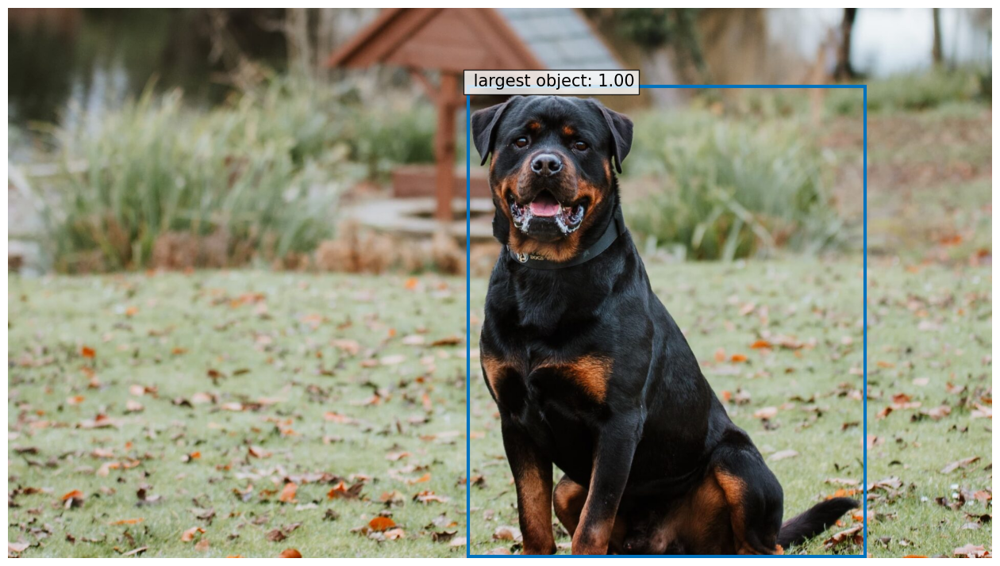

[tensor([477.7181, 247.4747, 709.3798, 470.0626], grad_fn=<SelectBackward0>), tensor([ 760.6259,  241.3785, 1078.6981,  398.0559], grad_fn=<SelectBackward0>)]


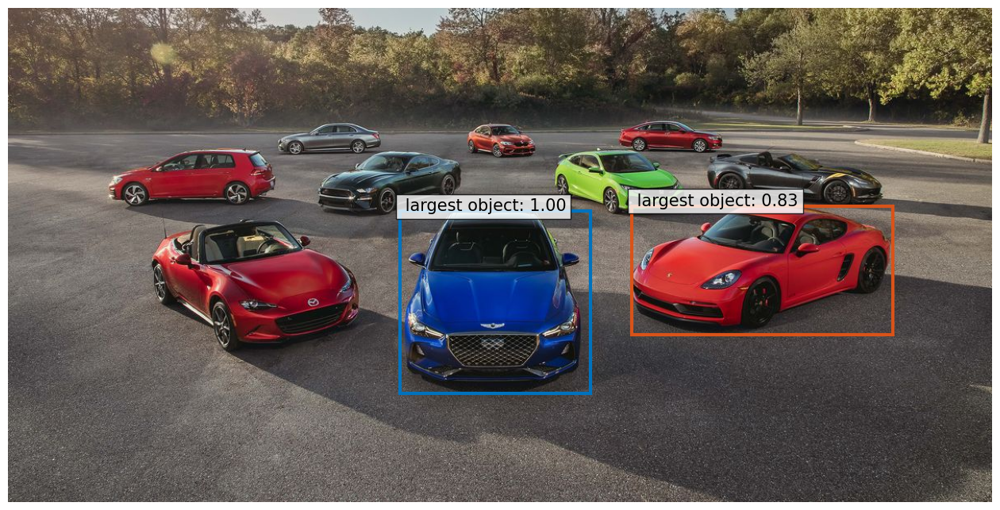

KeyboardInterrupt: ignored

In [ ]:
import os
dir = 'images_def'
for image_path in os.listdir(dir):
    plot_inference_results(f"/content/{dir}/{image_path}", PROMT_MDETR)

In [ ]:
# Функция для создания маски
from PIL import ImageDraw
def plot_inference_results_mask(img_path, text, model=mdetr_pg, img_transform=img_transform, tokenizer=tokenizer):
    img = Image.open(img_path)
    img_size = img.size
    tokenized = tokenizer.batch_encode_plus([text], padding="longest", return_tensors="pt")
    img_transformed = img_transform(img)

    # If the model expects a batch, ensure the input is unsqueezed to create a batch dimension
    if len(img_transformed.shape) == 3:
        img_transformed = img_transformed.unsqueeze(0)

    outputs = model(img_transformed, tokenized["input_ids"])

    probs, boxes, labels = postprocess_for_plot(outputs, text, tokenized, img_size)

    mask = Image.new('L', img_size, 0)
    for box, label in zip(boxes, labels):
        draw = ImageDraw.Draw(mask)
        # Make sure box coordinates are in the proper format for drawing
        draw.rectangle([(box[0], box[1]), (box[2], box[3])], fill=255)

    masked_image = Image.composite(img, Image.new('RGB', img.size), mask)
    masked_image.show()
    mask.save('the_mask.png')
    masked_image.save('the_masked_img.png')

In [ ]:
plot_inference_results_mask('/content/cars.jpg', PROMT_MDETR)

#### Diffusion with Inpainting Model

In [ ]:
!pip install diffusers

In [ ]:
!pip install accelerate

In [ ]:
!pip install -qq -U diffusers==0.11.1 transformers ftfy gradio accelerate

In [ ]:
# enter your hd token
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
import inspect
from typing import List, Optional, Union

import numpy as np
import torch

import PIL
import gradio as gr
from diffusers import StableDiffusionInpaintPipeline

In [ ]:
device = "cuda"
model_path = "runwayml/stable-diffusion-inpainting"

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16,
).to(device)

In [ ]:
import requests
from io import BytesIO

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = PIL.Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid


def download_image(img):
    return PIL.Image.open(img)

#### Dog 4k Generated Photo

In [ ]:
image = '/content/images_def/1.jpg'
plot_inference_results_mask(image,PROMT_MDETR)
mask = 'the_mask.png'

In [ ]:
image = download_image(image).resize((512, 512))

In [ ]:
mask =  download_image(mask).resize((512, 512))

In [ ]:
prompt = "dog, brown dog sitting on the ground, 4k, photorealistic"

guidance_scale=7.5
num_samples = 3
generator = torch.Generator(device="cuda").manual_seed(0) # change the seed to get different results

images = pipe(
    prompt=prompt,
    image=image,
    mask_image=mask,
    guidance_scale=guidance_scale,
    generator=generator,
    num_images_per_prompt=num_samples,
).images

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
# insert initial image in the list so we can compare side by side
images.insert(0, image)

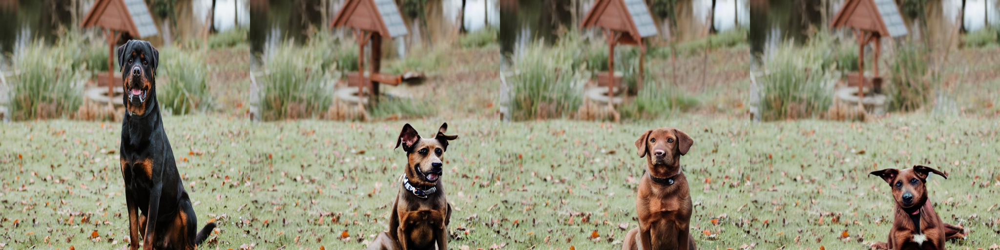

In [ ]:
image_grid(images, 1, num_samples + 1)

#### Puppy 4K Generated Photo

In [ ]:
image = '/content/images_def/Dogs.jpg'
plot_inference_results_mask(image,PROMT_MDETR)
mask = 'the_mask.png'

image = download_image(image).resize((512, 512))
mask =  download_image(mask).resize((512, 512))

In [ ]:
prompt = "puppies, golden retriver puppies sitting on the ground next to other puppies, 4k, photorealistic"

guidance_scale=7.5
num_samples = 3
generator = torch.Generator(device="cuda").manual_seed(0) # change the seed to get different results

images = pipe(
    prompt=prompt,
    image=image,
    mask_image=mask,
    guidance_scale=guidance_scale,
    generator=generator,
    num_images_per_prompt=num_samples,
).images

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
images.insert(0, image)

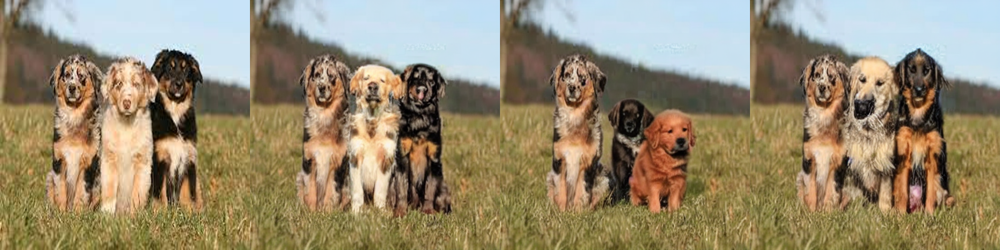

In [ ]:
image_grid(images, 1, num_samples + 1)

#### Horse 4k Generated Photo

In [ ]:
image = '/content/images_def/horses.jpeg'
plot_inference_results_mask(image,PROMT_MDETR)
mask = 'the_mask.png'

image = download_image(image).resize((512, 512))
mask =  download_image(mask).resize((512, 512))

In [ ]:
prompt = "black horses, black horses running on the ground, 4k , photoralistic"

guidance_scale=7.5
num_samples = 3
generator = torch.Generator(device="cuda").manual_seed(0) # change the seed to get different results

images = pipe(
    prompt=prompt,
    image=image,
    mask_image=mask,
    guidance_scale=guidance_scale,
    generator=generator,
    num_images_per_prompt=num_samples,
).images

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
images.insert(0, image)

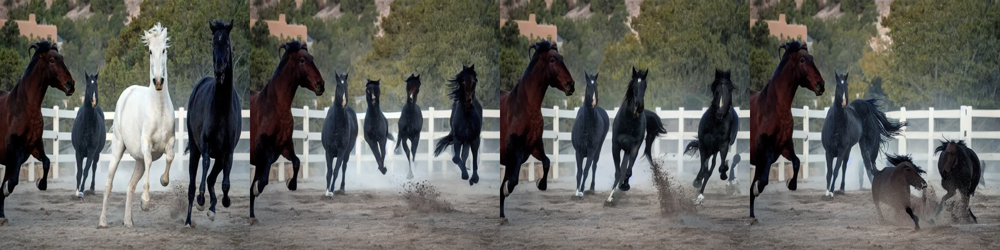

In [ ]:
image_grid(images, 1, num_samples + 1)

#### Car Photo Generated Photo

In [ ]:
image = '/content/images_def/cars.jpg'
plot_inference_results_mask(image,PROMT_MDETR)
mask = 'the_mask.png'

image = download_image(image).resize((512, 512))
mask =  download_image(mask).resize((512, 512))

In [ ]:
prompt = "mersedes cars, mersedes cars standing on the ground next to others cars, 4k , photoralistic"

guidance_scale=7.5
num_samples = 3
generator = torch.Generator(device="cuda").manual_seed(0) # change the seed to get different results

images = pipe(
    prompt=prompt,
    image=image,
    mask_image=mask,
    guidance_scale=guidance_scale,
    generator=generator,
    num_images_per_prompt=num_samples,
).images

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
images.insert(0, image)

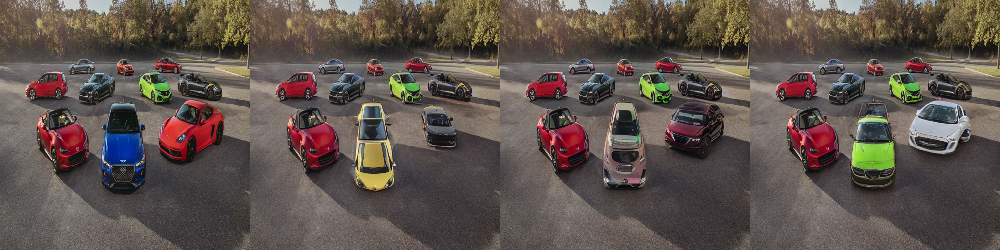

In [ ]:
image_grid(images, 1, num_samples + 1)

#### GRADIO

Demos

DEMO -- https://drive.google.com/file/d/1_8_nh64pn4DM0AwNk3S8rdiYg7JaGNue/view?usp=sharing

In [ ]:
def plot_inference_results_mask(img_path, text, model=mdetr_pg, img_transform=img_transform, tokenizer=tokenizer):
    img = Image.open(img_path)
    img_size = img.size
    tokenized = tokenizer.batch_encode_plus([text], padding="longest", return_tensors="pt")
    img_transformed = img_transform(img)

    # If the model expects a batch, ensure the input is unsqueezed to create a batch dimension
    if len(img_transformed.shape) == 3:
        img_transformed = img_transformed.unsqueeze(0)

    outputs = model(img_transformed, tokenized["input_ids"])

    probs, boxes, labels = postprocess_for_plot(outputs, text, tokenized, img_size)

    mask = Image.new('L', img_size, 0)
    for box, label in zip(boxes, labels):
        draw = ImageDraw.Draw(mask)
        # Make sure box coordinates are in the proper format for drawing
        draw.rectangle([(box[0], box[1]), (box[2], box[3])], fill=255)

    masked_image = Image.composite(img, Image.new('RGB', img.size), mask)
    masked_image.show()
    mask.save('the_mask.png')
    masked_image.save('the_masked_img.png')

In [ ]:
def predict(img_path, prompt):
    # Open the input image and convert it to RGB, then resize
    image = Image.open(img_path).convert("RGB").resize((512, 512))
    # Call the plotting function, passing the actual image path and prompt
    plot_inference_results_mask(img_path, prompt)

    # Open the saved mask image and convert to RGB, then resize
    mask_image = Image.open('the_mask.png').convert("RGB").resize((512, 512))
    # I assume `pipe` refers to a model or function not defined here, so that part is skipped
    # Call your model or function with proper arguments and return the result
    images = pipe(prompt=prompt, image=image, mask_image=mask_image).images
    return images[0]

In [ ]:
import gradio as gr
from PIL import Image, ImageDraw

from queue import Queue

# Initialize a queue
request_queue = Queue()

# Function to handle requests and put them in the queue
def handle_request(image, question):
    request_queue.put((image, question))

# Function to process requests from the queue
def process_requests():
    while True:
        image, prompt = request_queue.get()
        # Process the data here, image, and question are available for processing

# Start a separate thread to process requests
import threading
processing_thread = threading.Thread(target=process_requests)
processing_thread.start()

# Define the inputs and outputs for the Gradio app
inputs = [
    gr.Image(type="filepath", label="Input Image"),
    gr.Textbox(label="Text Query")
]

outputs = [
    gr.Image(type="pil", label="Generated Mask"),
]

# Create the interface
interface = gr.Interface(fn=predict, inputs=inputs, outputs=outputs,
                     title="MDETR Inference",
                     description="Upload an image and input a text query to generate a mask and masked image.")

# Start Gradio app
interface.launch(debug=True)
interface.launch(debug=True)

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://de700b0ff1189a5b51.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://de700b0ff1189a5b51.gradio.live
Rerunning server... use `close()` to stop if you need to change `launch()` parameters.
----
Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://de700b0ff1189a5b51.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


KeyboardInterrupt: ignored

In [ ]:
promts =["dog, german shepherd standing on the ground, 4k, photorealistic",
         'black horses, black horses running on the ground, 4k , photoralistic',
         "puppies, golden retriver puppies sitting on the ground next to other puppies, 4k, photorealistic"]